# Sentiment analysis 

## First to connect and collect

In [2]:
#We first run the Collecting notebook which will connect us with MySQL and Twitter as well as collect new tweets depending on
    #the choices of the user.

%run Collecting.ipynb

[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\Thanasis\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\Thanasis\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\Thanasis\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\Thanasis\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


If you want to use already collected data saved into csv files please enter the number '0', otherwise if you want to connect to MySQL Workbench and work with the data available there or even collect new tweets press the number '1'. Your answer: 0


## Collecting the data inside Jupyter Notebook 

In [3]:
if(answer_mysql == "0"):
    
    while(1):
    
        #Show all csv files in the working directory

        print("Here are all the existing csv files in the directory.\n")

        path = os.getcwd()
        csv_files = glob.glob(os.path.join(path, "*.csv"))

        for f in csv_files:

            df_show = pd.read_csv(f)

            print('Location:', f)
            print('File Name:', f.split("\\")[-1])

            print('Content:')
            display(df_show)
            print()
        
        time.sleep(1)
        
        answer_csv = input("\nPlease enter the name of the csv file you want to use together with the '.csv' extension in the end. Your answer: ")
        
        try:

            df = pd.read_csv(answer_csv)

            break

        except:

            print("\nThere was an error with the file name you entered. Please try again.\n")

    df.drop(df.columns[0], axis = 1, inplace = True)
        
else:
    
    #We collect the data that was saved in MySQL

    query = "SELECT id_str, text, created_at, polarity, user_location FROM {}".format(table_name)

    df = pd.read_sql(query, con = db)

    while(1):
    
        answer_save = input("If you do not want to save the dataset as a csv file please enter the number '0', otherwise press the number '1'. Your answer: ")    
    
        if(answer_save == "0" or answer_save == "1"):

            break

        print("\nYou answered something apart from '0' and '1'. Please try again.\n")
    
    if(answer_save == "1"):    
        
        print("\n")
        
        while(1):
        
            print("Here are all the existing csv files in the directory.\n")
            
            path = os.getcwd()
            csv_files = glob.glob(os.path.join(path, "*.csv"))

            for f in csv_files:
                # read the csv file
                df_show = pd.read_csv(f)

                # print the location and filename
                print('Location:', f)
                print('File Name:', f.split("\\")[-1])

                # print the content
                print('Content:')
                display(df_show)
                print()
            
            time.sleep(1)
            
            answer_save_name = input("Be careful, if you save the dataset using an existing csv filename the file will be overwritten. Now please enter the name of the csv file you want to save together with the '.csv' extension. Your answer: ")
            
            if(answer_save_name[-1] == "v"):

                if(answer_save_name[-2] == "s"):

                    if(answer_save_name[-3] == "c"):

                        if(answer_save_name[-4] == "."):

                            try:

                                df.to_csv(answer_save_name)

                                break

                            except:

                                print("\nThere was an error with the file name you entered. Please try again.\n")

                                continue

            print("\nThere was an error with the file name you entered. Please try again.\n")

print("\n")

while(1):
    
    answer_iloc = input("If the dataset has a lot of instances it is suggested to take a smaller part of it. If you want to take a fraction of the dataset please enter the number '0', otherwise enter the number '1'. Your answer: ")
    
    if(answer_iloc == "0" or answer_iloc == "1"):

        break

    print("\nYou answered something apart from '0' and '1'. Please try again.\n")
    
if(answer_iloc == "0"):
    
    print("\n")
    
    while(1):
    
        answer_iloc_number = input(f"Please enter an integer number showcasing how many instances you want to keep out of the {len(df.index)} available. Your answer: ")
        
        try:
            
            start = randint(0, len(df.index) - int(answer_iloc_number))
            df = df.iloc[start: (start + int(answer_iloc_number))]
            
            break

        except:

            print("\n2There was an error with the number you entered. Please try again.\n")

#Storing the df for later use in another notebook           

print("\n")
%store df
print("\n")
df

Here are all the existing csv files in the directory.

Location: C:\Users\Thanasis\Desktop\Thesis\airline.csv
File Name: airline.csv
Content:


,_unit_id,_golden,_unit_state,_trusted_judgments,_last_judgment_at,airline_sentiment,airline_sentiment:confidence,negativereason,negativereason:confidence,airline,airline_sentiment_gold,name,negativereason_gold,retweet_count,text,tweet_coord,tweet_created,tweet_id,tweet_location,user_timezone
0,681448150,False,finalized,3,2/25/15 5:24,neutral,1.0000,NaN,NaN,Virgin America,NaN,cairdin,NaN,0,@VirginAmerica What @dhepburn said.,NaN,2/24/15 11:35,5.703060e+17,NaN,Eastern Time (US & Canada)
1,681448153,False,finalized,3,2/25/15 1:53,positive,0.3486,NaN,0.0000,Virgin America,NaN,jnardino,NaN,0,@VirginAmerica plus you've added commercials t...,NaN,2/24/15 11:15,5.703010e+17,NaN,Pacific Time (US & Canada)
2,681448156,False,finalized,3,2/25/15 10:01,neutral,0.6837,NaN,NaN,Virgin America,NaN,yvonnalynn,NaN,0,@VirginAmerica I didn't today... Must mean I n...,NaN,2/24/15 11:15,5.703010e+17,Lets Play,Central Time (US & Canada)
3,681448158,False,finalized,3,2/25/15 3:05,negative,1.0000,Bad Flight,0.7033,Virgin America,NaN,jnardino,NaN,0,@VirginAmerica it's really aggressive to blast...,NaN,2/24/15 11:15,5.703010e+17,NaN,Pacific Time (US & Canada)
4,681448159,False,finalized,3,2/25/15 5:50,negative,1.0000,Can't Tell,1.0000,Virgin America,NaN,jnardino,NaN,0,@VirginAmerica and it's a really big bad thing...,NaN,2/24/15 11:14,5.703010e+17,NaN,Pacific Time (US & Canada)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14635,681679794,False,finalized,3,2/25/15 19:46,positive,0.3487,NaN,0.0000,American,NaN,KristenReenders,NaN,0,@AmericanAir thank you we got on a different f...,NaN,2/22/15 12:01,5.695880e+17,NaN,NaN
14636,681679795,False,finalized,3,2/25/15 19:14,negative,1.0000,Customer Service Issue,1.0000,American,NaN,itsropes,NaN,0,@AmericanAir leaving over 20 minutes Late Flig...,NaN,2/22/15 11:59,5.695870e+17,Texas,NaN
14637,681679796,False,finalized,3,2/25/15 19:04,neutral,1.0000,NaN,NaN,American,NaN,sanyabun,NaN,0,@AmericanAir Please bring American Airlines to...,NaN,2/22/15 11:59,5.695870e+17,"Nigeria,lagos",NaN
14638,681679797,False,finalized,3,2/25/15 18:59,negative,1.0000,Customer Service Issue,0.6659,American,NaN,SraJackson,NaN,0,"@AmericanAir you have my money, you change my ...",NaN,2/22/15 11:59,5.695870e+17,New Jersey,Eastern Time (US & Canada)



Location: C:\Users\Thanasis\Desktop\Thesis\coachella.csv
File Name: coachella.csv
Content:


,coachella_sentiment,coachella_yn,name,retweet_count,text,tweet_coord,tweet_created,tweet_id,tweet_location,user_timezone
0,positive,yes,kokombil,0,#Coachella2015 tickets selling out in less tha...,"[0.0, 0.0]",1/7/15 15:02,5.529630e+17,NaN,Quito
1,positive,yes,MisssTaraaa10,2,RT @sudsybuddy: WAIT THIS IS ABSOLUTE FIRE _�Ӵ...,NaN,1/7/15 15:02,5.529630e+17,united states,NaN
2,positive,yes,NMcCracken805,0,#Coachella2015 #VIP passes secured! See you th...,NaN,1/7/15 15:01,5.529630e+17,"Costa Mesa, CA",NaN
3,positive,yes,wxpnfm,1,Philly�۪s @warondrugsjams will play #Coachella...,NaN,1/7/15 15:01,5.529630e+17,"Philadelphia, PA and Worldwide",Quito
4,positive,yes,Caesears,0,If briana and her mom out to #Coachella2015 i...,NaN,1/7/15 15:00,5.529630e+17,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...
3841,cant tell,yes,MissXOverdose,0,Excuse me while I go cry now. _��� #Coachella2...,NaN,1/6/15 10:32,5.525330e+17,atx,Pacific Time (US & Canada)
3842,cant tell,yes,NedRaggett,1,RT @touchofallright: Ride and Steely Dan. It w...,NaN,1/6/15 10:28,5.525320e+17,"Costa Mesa, CA",Pacific Time (US & Canada)
3843,cant tell,yes,nicolejackieee,0,I've been callin that since day one #Coachella...,NaN,1/6/15 10:26,5.525320e+17,NaN,NaN
3844,cant tell,yes,NiqueWobbitz,2,Is this for real?!?! #Coachella2015 http://t.c...,NaN,1/6/15 10:21,5.525300e+17,Huntington Beach X Long Beach,Pacific Time (US & Canada)



Location: C:\Users\Thanasis\Desktop\Thesis\corona1.csv
File Name: corona1.csv
Content:


,UserName,ScreenName,Location,TweetAt,OriginalTweet,Sentiment
0,3799,48751,London,16-03-2020,@MeNyrbie @Phil_Gahan @Chrisitv https://t.co/i...,Neutral
1,3800,48752,UK,16-03-2020,advice Talk to your neighbours family to excha...,Positive
2,3801,48753,Vagabonds,16-03-2020,Coronavirus Australia: Woolworths to give elde...,Positive
3,3802,48754,NaN,16-03-2020,My food stock is not the only one which is emp...,Positive
4,3803,48755,NaN,16-03-2020,"Me, ready to go at supermarket during the #COV...",Extremely Negative
...,...,...,...,...,...,...
41152,44951,89903,"Wellington City, New Zealand",14-04-2020,Airline pilots offering to stock supermarket s...,Neutral
41153,44952,89904,NaN,14-04-2020,Response to complaint not provided citing COVI...,Extremely Negative
41154,44953,89905,NaN,14-04-2020,You know its getting tough when @KameronWilds...,Positive
41155,44954,89906,NaN,14-04-2020,Is it wrong that the smell of hand sanitizer i...,Neutral



Location: C:\Users\Thanasis\Desktop\Thesis\corona2.csv
File Name: corona2.csv
Content:


,UserName,ScreenName,Location,TweetAt,OriginalTweet,Sentiment
0,1,44953,NYC,02-03-2020,TRENDING: New Yorkers encounter empty supermar...,Extremely Negative
1,2,44954,"Seattle, WA",02-03-2020,When I couldn't find hand sanitizer at Fred Me...,Positive
2,3,44955,NaN,02-03-2020,Find out how you can protect yourself and love...,Extremely Positive
3,4,44956,Chicagoland,02-03-2020,#Panic buying hits #NewYork City as anxious sh...,Negative
4,5,44957,"Melbourne, Victoria",03-03-2020,#toiletpaper #dunnypaper #coronavirus #coronav...,Neutral
...,...,...,...,...,...,...
3793,3794,48746,Israel ??,16-03-2020,Meanwhile In A Supermarket in Israel -- People...,Positive
3794,3795,48747,"Farmington, NM",16-03-2020,Did you panic buy a lot of non-perishable item...,Negative
3795,3796,48748,"Haverford, PA",16-03-2020,Asst Prof of Economics @cconces was on @NBCPhi...,Neutral
3796,3797,48749,NaN,16-03-2020,Gov need to do somethings instead of biar je r...,Extremely Negative



Location: C:\Users\Thanasis\Desktop\Thesis\dilemma.csv
File Name: dilemma.csv
Content:


,user_name,user_location,user_description,user_created,user_followers,user_friends,user_favourites,user_verified,date,text,hashtags,source,is_retweet,Sentiment
0,Mari Smith,"San Diego, California",Premier Facebook Marketing Expert | Social Med...,2007-09-11 22:22:51,579942,288625,11610,False,2020-09-16 20:55:33,@musicmadmarc @SocialDilemma_ @netflix @Facebo...,NaN,Twitter Web App,False,Neutral
1,Mari Smith,"San Diego, California",Premier Facebook Marketing Expert | Social Med...,2007-09-11 22:22:51,579942,288625,11610,False,2020-09-16 20:53:17,@musicmadmarc @SocialDilemma_ @netflix @Facebo...,NaN,Twitter Web App,False,Neutral
2,Varun Tyagi,"Goa, India",Indian | Tech Solution Artist & Hospitality Ex...,2009-09-06 10:36:01,257,204,475,False,2020-09-16 20:51:57,Go watch “The Social Dilemma” on Netflix!\n\nI...,NaN,Twitter for iPhone,False,Positive
3,Casey Conway,"Sydney, New South Wales",Head of Diversity & Inclusion @RugbyAU | It's ...,2012-12-28 21:45:06,11782,1033,12219,True,2020-09-16 20:51:46,I watched #TheSocialDilemma last night. I’m sc...,['TheSocialDilemma'],Twitter for iPhone,False,Negative
4,Charlotte Paul,Darlington,Instagram Charlottejyates,2012-05-28 20:43:08,278,387,5850,False,2020-09-16 20:51:11,The problem of me being on my phone most the t...,['TheSocialDilemma'],Twitter for iPhone,False,Positive
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20063,scp.,NaN,"“Through love, all is possible.” - SJM - See m...",2013-02-19 00:55:12,431,193,32958,False,2020-10-09 00:25:53,#TheSocialDilemma yalll.... this shit... we kn...,['TheSocialDilemma'],Twitter for iPhone,False,Negative
20064,Dono6971,United States,"Father, Husband, and a Dude|| Love Notre Dame ...",2010-01-06 04:08:41,172,96,50159,False,2020-10-09 00:24:45,Peeps:\n\nFind 90 minutes this weekend and wat...,NaN,Twitter for iPhone,False,Positive
20065,Remi Shores,NaN,Genderfluid / They/Them/Theirs / Queer Christi...,2012-05-16 23:49:13,387,652,7885,False,2020-10-09 00:11:42,"So you watched #thesocialdilemma, or have been...",['thesocialdilemma'],Twitter Web App,False,Negative
20066,Scott the Great and Terrible,NaN,"I can't recall the taste of food, nor the soun...",2020-03-16 18:20:31,103,84,2976,False,2020-10-09 00:10:16,Good social media advice:\n\nChoose the thing ...,['TheSocialDilemma'],Twitter Web App,False,Positive



Location: C:\Users\Thanasis\Desktop\Thesis\fake_news.csv
File Name: fake_news.csv
Content:


,title,text,subject,date
0,Donald Trump Sends Out Embarrassing New Year’...,Donald Trump just couldn t wish all Americans ...,News,"December 31, 2017"
1,Drunk Bragging Trump Staffer Started Russian ...,House Intelligence Committee Chairman Devin Nu...,News,"December 31, 2017"
2,Sheriff David Clarke Becomes An Internet Joke...,"On Friday, it was revealed that former Milwauk...",News,"December 30, 2017"
3,Trump Is So Obsessed He Even Has Obama’s Name...,"On Christmas day, Donald Trump announced that ...",News,"December 29, 2017"
4,Pope Francis Just Called Out Donald Trump Dur...,Pope Francis used his annual Christmas Day mes...,News,"December 25, 2017"
...,...,...,...,...
23476,McPain: John McCain Furious That Iran Treated ...,21st Century Wire says As 21WIRE reported earl...,Middle-east,"January 16, 2016"
23477,JUSTICE? Yahoo Settles E-mail Privacy Class-ac...,21st Century Wire says It s a familiar theme. ...,Middle-east,"January 16, 2016"
23478,Sunnistan: US and Allied ‘Safe Zone’ Plan to T...,Patrick Henningsen 21st Century WireRemember ...,Middle-east,"January 15, 2016"
23479,How to Blow $700 Million: Al Jazeera America F...,21st Century Wire says Al Jazeera America will...,Middle-east,"January 14, 2016"



Location: C:\Users\Thanasis\Desktop\Thesis\mytweets.csv
File Name: mytweets.csv
Content:


,Unnamed: 0,id_str,text,created_at,polarity,user_location
0,0,1424375081829081088,Theres a quote in here that gets me and gets t...,2021-08-08 14:20:57,0,"Franklin, TN"
1,1,1424375081749204999,I dont think the term leaky is understood by a...,2021-08-08 14:20:57,0,"Surrey, British Columbia"
2,2,1424375084043673602,"@Matthew_4_Trump Because, like all other coron...",2021-08-08 14:20:58,0,NaN
3,3,1424375086665064451,@BillieJeanHTW1 even worse than the vaccine as...,2021-08-08 14:20:58,0,NaN
4,4,1424375094764314629,@isell444 @JMuskeeto @RonMilnerBoodle Not exac...,2021-08-08 14:21:00,0,NaN
...,...,...,...,...,...,...
499995,499995,1426204759820840963,How long until we move onto blowdart sharpshoo...,2021-08-13 15:31:27,0,Greatest City in World
499996,499996,1426204762287087618,@adrienne_haddad You may do to your own body w...,2021-08-13 15:31:27,1,Texas
499997,499997,1426204764996575241,FDA Approves Third COVID Vaccine Dose for Immu...,2021-08-13 15:31:28,0,United States
499998,499998,1426204767139860484,You dont get covid from having fun. You get co...,2021-08-13 15:31:28,0,Oxford - Rome



Location: C:\Users\Thanasis\Desktop\Thesis\true_news.csv
File Name: true_news.csv
Content:


,title,text,subject,date
0,"As U.S. budget fight looms, Republicans flip t...",WASHINGTON (Reuters) - The head of a conservat...,politicsNews,"December 31, 2017"
1,U.S. military to accept transgender recruits o...,WASHINGTON (Reuters) - Transgender people will...,politicsNews,"December 29, 2017"
2,Senior U.S. Republican senator: 'Let Mr. Muell...,WASHINGTON (Reuters) - The special counsel inv...,politicsNews,"December 31, 2017"
3,FBI Russia probe helped by Australian diplomat...,WASHINGTON (Reuters) - Trump campaign adviser ...,politicsNews,"December 30, 2017"
4,Trump wants Postal Service to charge 'much mor...,SEATTLE/WASHINGTON (Reuters) - President Donal...,politicsNews,"December 29, 2017"
...,...,...,...,...
21412,'Fully committed' NATO backs new U.S. approach...,BRUSSELS (Reuters) - NATO allies on Tuesday we...,worldnews,"August 22, 2017"
21413,LexisNexis withdrew two products from Chinese ...,"LONDON (Reuters) - LexisNexis, a provider of l...",worldnews,"August 22, 2017"
21414,Minsk cultural hub becomes haven from authorities,MINSK (Reuters) - In the shadow of disused Sov...,worldnews,"August 22, 2017"
21415,Vatican upbeat on possibility of Pope Francis ...,MOSCOW (Reuters) - Vatican Secretary of State ...,worldnews,"August 22, 2017"




Please enter the name of the csv file you want to use together with the '.csv' extension in the end. Your answer: mytweets.csv


If the dataset has a lot of instances it is suggested to take a smaller part of it. If you want to take a fraction of the dataset please enter the number '0', otherwise enter the number '1'. Your answer: 0


Please enter an integer number showcasing how many instances you want to keep out of the 500000 available. Your answer: 50000


Stored 'df' (DataFrame)




,id_str,text,created_at,polarity,user_location
314879,1425496491330842624,@Shawn_on_Games @nypost Do you not realize the...,2021-08-11 16:37:02,0,"Orange Park, FL"
314880,1425496492685598725,Get ready!!! FAUCI warns FULL VACCINE MANDAT...,2021-08-11 16:37:02,0,"Michigan, USA"
314881,1425496493667098625,"it's one thing to get the vaccine voluntarily,...",2021-08-11 16:37:03,0,"Toronto, Ontario"
314882,1425496493830643716,@ScruffyVandal @Justasnowmexic1 @JiQed @Newswe...,2021-08-11 16:37:03,1,NaN
314883,1425496494065528835,I can't believe we continue to fall into media...,2021-08-11 16:37:03,0,NaN
...,...,...,...,...,...
364874,1425862484397854725,If you decide to get vaccinated against COVID ...,2021-08-12 16:51:22,0,"Lutz, FL"
364875,1425862486830501888,@DavidRF34 @archerbandrodie @realTuckFrumper H...,2021-08-12 16:51:22,1,Born in the USA
364876,1425862488277520384,Of course the media is silent. WellIn their de...,2021-08-12 16:51:23,0,NaN
364877,1425862488285921289,@kayleighmcenany Florida radio host hospitaliz...,2021-08-12 16:51:23,0,NaN


## Transforming the data to enable time series

In [4]:
#Clean and transform data to enable time series

df['created_at'] = pd.to_datetime(df['created_at'])

time_series_df = df.groupby([pd.Grouper(key = 'created_at', freq = '2 s'), 'polarity']).count().unstack(fill_value = 0).stack().reset_index()

time_series_df['created_at'] = pd.to_datetime(time_series_df['created_at']).apply(lambda x: x.strftime('%H:%M'))

time_series_df = time_series_df.rename(columns = {"id_str": "Number of Covid-19 vaccine mentions", "created_at":"Time in UTC"})

time_series = time_series_df["Time in UTC"][time_series_df['polarity'] == 0].reset_index(drop = True)

%store time_series
print("\n")
%store time_series_df
print("\n")
time_series_df

Stored 'time_series' (Series)


Stored 'time_series_df' (DataFrame)




,Time in UTC,polarity,Number of Covid-19 vaccine mentions,text,user_location
0,16:37,-1,0,0,0
1,16:37,0,6,6,4
2,16:37,1,1,1,0
3,16:37,-1,0,0,0
4,16:37,0,12,12,10
...,...,...,...,...,...
19678,16:51,0,9,9,6
19679,16:51,1,0,0,0
19680,16:51,-1,1,1,1
19681,16:51,0,5,5,2


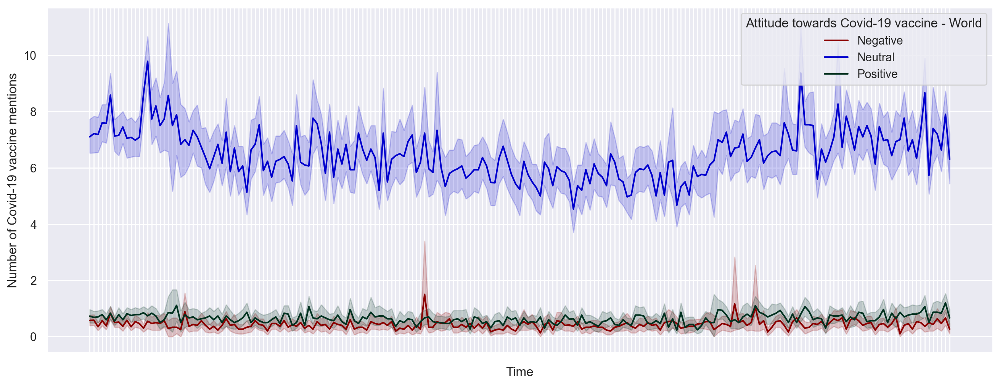

In [5]:
#Plot line chart 

mpl.rcParams['figure.dpi'] = 200
plt.figure(figsize = (16, 6))
sns.set(style = "darkgrid")

ax = sns.lineplot(x = "Time in UTC" ,y = "Number of Covid-19 vaccine mentions", hue = 'polarity', data = time_series_df, 
                  palette = sns.color_palette(["#8b0000","#0000cd", "#013220"]))
ax.set(xlabel = 'Time', ylabel = "Number of Covid-19 vaccine mentions")
plt.legend(title = 'Attitude towards Covid-19 vaccine - World', loc = 'upper right', labels = ['Negative', 'Neutral', 'Positive'])
sns.set(rc = {"lines.linewidth": 1})
ax.set(xticklabels = [])

plt.show()

In [6]:
#Create a pie chart to show the percentage of each emotion

df_pie = df.groupby('polarity').size()

mylabels = ["Negative", "Neutral", "Positive"]
mycolors = ["darkred","mediumblue", "darkgreen"]
myvalues = [df_pie[-1], df_pie[0], df_pie[1]]

%store myvalues

fig = go.Figure(data = [go.Pie(labels = mylabels, values = myvalues)])
fig.update_traces(hoverinfo = 'label+percent', textinfo = 'value', textfont_size = 20, 
                  marker = dict(colors = mycolors, line = dict(color = '#000000', width = 2)),
                  title = "Polarity Pie - World")
fig.show()

Stored 'myvalues' (list)


## Tracking words with Natural Language Processing using RE and NLTK

In [7]:
#Remove any further unnecessary characters and join all tweets

content = ' '.join(df["text"])
content = re.sub(r"http\S+", "", content)
content = content.replace('RT ', ' ').replace('&amp;', 'and')
content = re.sub('[^A-Za-z0-9]+', ' ', content)
content = content.lower()

content

' shawn on games nypost do you not realize there is no covid 19 vaccine there is an experimental drug that contain get ready fauci warns full vaccine mandates coming pending fda s full approval of the vaccines they are be it s one thing to get the vaccine voluntarily it s another thing to force people to get it it s one thing to requ scruffyvandal justasnowmexic1 jiqed newsweek the intelligent people whove been paying attention know that this i can t believe we continue to fall into medias divisive tactics with this vaccine they used it in trump s presid jonjpreston coatsy79 helioschariot govuk i gave you the only valid reason the vaccine does not prevent someone the investigation into andrew cuomo revealed a pattern of harassment back to school panic as states hold onto t theroot just a typical conservative trumpster vaccine denier smh women in their 40s have the highest rate of adverse events imillhiser mcelhearn yes the government has all sorts of similar mandates like wearing seatb

In [8]:
#Create a dataframe with all the words and their individual frequency

tokenized_word = word_tokenize(content)
stop_words = set(stopwords.words("english"))

filtered = []

for i in tokenized_word:
    if i not in stop_words:
        filtered.append(i)

freq_dist = FreqDist(filtered)
freq_df = pd.DataFrame(freq_dist.most_common(10), columns = ["Word", "Frequency"]).drop([0]).reindex()

freq_df

,Word,Frequency
1,covid,6282
2,get,5727
3,people,5030
4,got,1969
5,vaccinated,1969
6,19,1929
7,like,1927
8,vaccines,1835
9,dont,1785


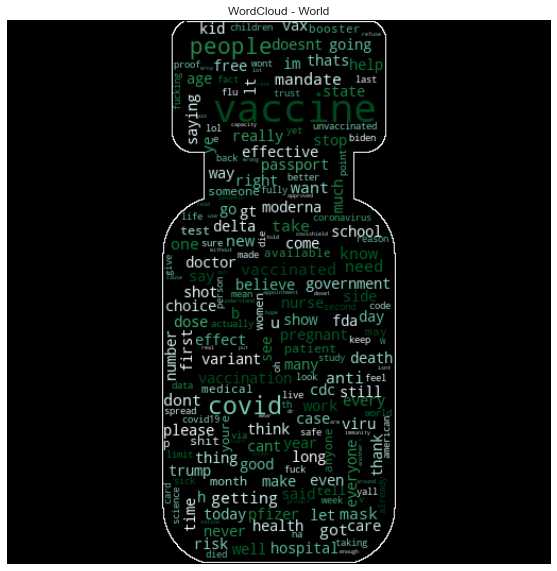

In [9]:
#Create a word cloud with most used words

%matplotlib inline

my_mask = np.array(Image.open('vaccine_vial.png'))

text_cloud = ""

for i in filtered: 
    
    text_cloud = text_cloud + i + " "  

word_cloud = WordCloud(collocations = False, mask = my_mask, background_color = 'black', colormap = "BuGn",
                       contour_width = 1, contour_color = 'white', width = 600, height = 300,)

cloud = word_cloud.generate(text_cloud)

plt.figure(figsize = (20, 10))
plt.imshow(word_cloud, interpolation = 'bilinear')
plt.axis("off")
plt.title("WordCloud - World")

cloud.to_file("wordcloud_world.png")

plt.show()

In [10]:
#Create a bar plot with most used words

fig = px.bar(freq_df, x = "Word", y = "Frequency", title = "Word Frequency Bar Plot - World")
fig.update_traces(marker_color = 'rgb(0,139,139)', marker_line_color = 'rgb(0,0,0)', marker_line_width = 2)

fig.show()

## Collecting the data only from the USA

In [11]:
#Create a dictionary of the states

states = ['Alabama', 'AL', 'Alaska', 'AK', 'American Samoa', 'AS', 'Arizona', 'AZ', 'Arkansas', 'AR', 'California', 'CA', 
          'Colorado', 'CO', 'Connecticut', 'CT', 'Delaware', 'DE', 'District of Columbia', 'DC', 
          'Federated states of Micronesia', 'FM', 'Florida', 'FL', 'Georgia', 'GA', 'Guam', 'GU', 'Hawaii', 'HI', 'Idaho', 'ID',
          'Illinois', 'IL', 'Indiana', 'IN', 'Iowa', 'IA', 'Kansas', 'KS', 'Kentucky', 'KY', 'Louisiana', 'LA', 'Maine', 'ME', 
          'Marshall Islands', 'MH', 'Maryland', 'MD', 'Massachusetts', 'MA', 'Michigan', 'MI', 'Minnesota', 'MN', 'Mississippi',
          'MS', 'Missouri', 'MO', 'Montana', 'MT', 'Nebraska', 'NE', 'Nevada', 'NV', 'New Hampshire', 'NH', 'New Jersey', 'NJ', 
          'New Mexico', 'NM', 'New York', 'NY', 'North Carolina', 'NC', 'North Dakota', 'ND', 'Northern Mariana Islands', 'MP', 
          'Ohio', 'OH', 'Oklahoma', 'OK', 'Oregon', 'OR', 'Palau', 'PW', 'Pennsylvania', 'PA', 'Puerto Rico', 'PR', 
          'Rhode Island', 'RI', 'South Carolina', 'SC', 'South Dakota', 'SD', 'Tennessee', 'TN', 'Texas', 'TX', 'Utah', 'UT', 
          'Vermont', 'VT', 'Virgin Islands', 'VI', 'Virginia', 'VA', 'Washington', 'WA', 'West Virginia', 'WV', 'Wisconsin', 
          'WI', 'Wyoming', 'WY']

state_dict = dict(itertools.zip_longest(*[iter(states)] * 2, fillvalue = ""))
inv_state_dict = dict((v,k) for k,v in state_dict.items())

%store states
print("\n")
%store state_dict
print("\n")
state_dict

Stored 'states' (list)


Stored 'state_dict' (dict)




{'Alabama': 'AL',
 'Alaska': 'AK',
 'American Samoa': 'AS',
 'Arizona': 'AZ',
 'Arkansas': 'AR',
 'California': 'CA',
 'Colorado': 'CO',
 'Connecticut': 'CT',
 'Delaware': 'DE',
 'District of Columbia': 'DC',
 'Federated states of Micronesia': 'FM',
 'Florida': 'FL',
 'Georgia': 'GA',
 'Guam': 'GU',
 'Hawaii': 'HI',
 'Idaho': 'ID',
 'Illinois': 'IL',
 'Indiana': 'IN',
 'Iowa': 'IA',
 'Kansas': 'KS',
 'Kentucky': 'KY',
 'Louisiana': 'LA',
 'Maine': 'ME',
 'Marshall Islands': 'MH',
 'Maryland': 'MD',
 'Massachusetts': 'MA',
 'Michigan': 'MI',
 'Minnesota': 'MN',
 'Mississippi': 'MS',
 'Missouri': 'MO',
 'Montana': 'MT',
 'Nebraska': 'NE',
 'Nevada': 'NV',
 'New Hampshire': 'NH',
 'New Jersey': 'NJ',
 'New Mexico': 'NM',
 'New York': 'NY',
 'North Carolina': 'NC',
 'North Dakota': 'ND',
 'Northern Mariana Islands': 'MP',
 'Ohio': 'OH',
 'Oklahoma': 'OK',
 'Oregon': 'OR',
 'Palau': 'PW',
 'Pennsylvania': 'PA',
 'Puerto Rico': 'PR',
 'Rhode Island': 'RI',
 'South Carolina': 'SC',
 'South Da

In [12]:
#Remove all tweets not made in the USA

df = df.fillna(" ")
df_usa = df

i = 0

for l in df_usa['user_location']:

    flag = 0
    
    for s in states:
        
        if s in l:
            
            flag = 1
    
    if flag == 0:

        df_usa = df_usa.drop(df_usa.index[i])
        
        i -= 1
        
    i += 1

df_usa

,id_str,text,created_at,polarity,user_location
314879,1425496491330842624,@Shawn_on_Games @nypost Do you not realize the...,2021-08-11 16:37:02,0,"Orange Park, FL"
314880,1425496492685598725,Get ready!!! FAUCI warns FULL VACCINE MANDAT...,2021-08-11 16:37:02,0,"Michigan, USA"
314885,1425496496825266182,: The investigation into Andrew Cuomo revealed...,2021-08-11 16:37:03,0,NYC
314888,1425496498964361216,@imillhiser @mcelhearn Yes. The government has...,2021-08-11 16:37:04,0,"El Cerrito, CA"
314893,1425496502152040449,MOTB\nEndTimes,2021-08-11 16:37:05,0,New Mexico USA
...,...,...,...,...,...
364857,1425862473022939147,"@asbell_tony @cachenca No, you said he flip fl...",2021-08-12 16:51:19,0,"Edmond, OK"
364861,1425862474386087944,"But mask wearing, hand washing, and physical d...",2021-08-12 16:51:19,0,EARTH
364863,1425862476491546632,If we could hurry up and make vaccines availab...,2021-08-12 16:51:20,0,"Washington, DC"
364870,1425862482971799566,I actually wouldnt have been able to be around...,2021-08-12 16:51:21,0,"Washington, DC"


In [13]:
#Calculate the percentage of US made tweets

percent_usa =  len(df_usa.index) * 100 / len(df.index)

print("\nThe total tweets created at USA are {}% of the overall tweet collection. Specifically they are {} out of {}.".format(round(percent_usa, 2), len(df_usa.index), len(df.index)))


The total tweets created at USA are 28.45% of the overall tweet collection. Specifically they are 14227 out of 50000.


In [14]:
#Clean and transform data to enable time series

time_series_df_usa = df_usa.groupby([pd.Grouper(key = 'created_at', freq = '2 s'), 'polarity']).count().unstack(fill_value = 0).stack().reset_index()

time_series_df_usa['created_at'] = pd.to_datetime(time_series_df_usa['created_at']).apply(lambda x: x.strftime('%H:%M'))

time_series_df_usa = time_series_df_usa.rename(columns = {"id_str": "Number of Covid-19 vaccine mentions", "created_at":"Time in UTC"})

time_series_usa = time_series_df_usa["Time in UTC"][time_series_df_usa['polarity'] == 0].reset_index(drop=True)

%store time_series_usa
print("\n")
%store time_series_df_usa
print("\n")
time_series_df_usa

Stored 'time_series_usa' (Series)


Stored 'time_series_df_usa' (DataFrame)




,Time in UTC,polarity,Number of Covid-19 vaccine mentions,text,user_location
0,16:37,-1,0,0,0
1,16:37,0,3,3,3
2,16:37,1,0,0,0
3,16:37,-1,0,0,0
4,16:37,0,3,3,3
...,...,...,...,...,...
17323,16:51,0,2,2,2
17324,16:51,1,0,0,0
17325,16:51,-1,0,0,0
17326,16:51,0,1,1,1


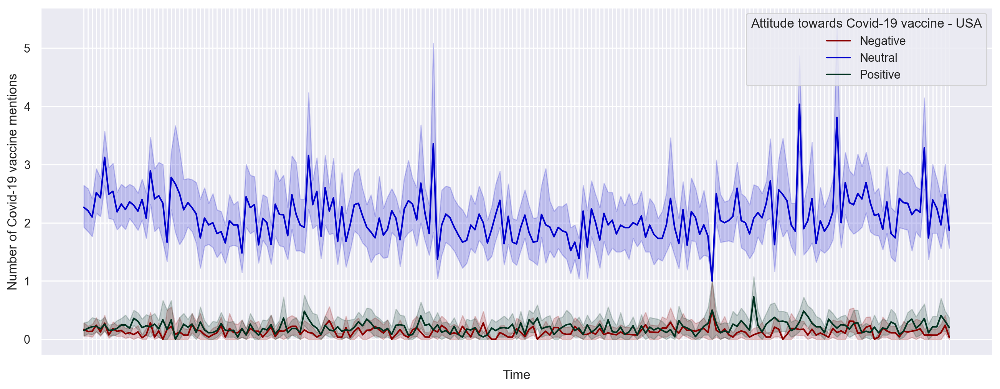

In [15]:
#Plot line chart 

mpl.rcParams['figure.dpi'] = 200
plt.figure(figsize = (16, 6))
sns.set(style = "darkgrid")

ax = sns.lineplot(x = "Time in UTC" ,y = "Number of Covid-19 vaccine mentions", hue = 'polarity', data = time_series_df_usa,
                  palette = sns.color_palette(["#8b0000","#0000cd", "#013220"]))
ax.set(xlabel = 'Time', ylabel = "Number of Covid-19 vaccine mentions")
plt.legend(title = 'Attitude towards Covid-19 vaccine - USA', loc = 'upper right', labels = ['Negative', 'Neutral', 'Positive'])
sns.set(rc = {"lines.linewidth": 1})
ax.set(xticklabels = [])

plt.show()

In [16]:
#Create a pie chart to show the percentage of each emotion

df_pie_usa = df_usa.groupby('polarity').size()

mylabels = ["Negative", "Neutral", "Positive"]
mycolors = ["darkred","mediumblue", "darkgreen"]
myvalues_usa = [df_pie_usa[-1], df_pie_usa[0], df_pie_usa[1]]

%store myvalues_usa

fig = go.Figure(data = [go.Pie(labels = mylabels, values = myvalues_usa)])
fig.update_traces(hoverinfo = 'label+percent', textinfo = 'value', textfont_size = 20, 
                  marker = dict(colors = mycolors, line = dict(color = '#000000', width = 2)),
                  title = "Polarity Pie - USA")

fig.show()

Stored 'myvalues_usa' (list)


In [17]:
#Remove any further unnecessary characters and join all tweets

content_usa = ' '.join(df_usa["text"])
content_usa = re.sub(r"http\S+", "", content_usa)
content_usa = content_usa.replace('RT ', ' ').replace('&amp;', 'and')
content_usa = re.sub('[^A-Za-z0-9]+', ' ', content_usa)
content_usa = content_usa.lower()

content_usa

' shawn on games nypost do you not realize there is no covid 19 vaccine there is an experimental drug that contain get ready fauci warns full vaccine mandates coming pending fda s full approval of the vaccines they are be the investigation into andrew cuomo revealed a pattern of harassment back to school panic as states hold onto t imillhiser mcelhearn yes the government has all sorts of similar mandates like wearing seatbelts that get motb endtimes masonresearch toni michelle travis professor emerita scharschool comments in this story on vaccine passports an oh my god taratesoro a vaccine is not for suppression of antibodies in which you might still get sick these people are selli bad news continues for mrna and vaccine producers alike usafacts nwo cv19 wmd in fauci lab gt release for election coup and nwo lockdown gt control masses w dem nwo justhefactsms erjmanlasvegas robin blue19 that is incorrect if you ask for medical info as a employer of your s a little bit of knowledge not ba

In [18]:
#Create a dataframe with all the words and their individual frequency

tokenized_word_usa = word_tokenize(content_usa)
stop_words_usa = set(stopwords.words("english"))

filtered_usa = []

for i in tokenized_word_usa:
    
    if i not in stop_words_usa:
        
        filtered_usa.append(i)

freq_dist_usa = FreqDist(filtered_usa)
freq_df_usa = pd.DataFrame(freq_dist_usa.most_common(10), columns=["Word", "Frequency"]).drop([0]).reindex()

freq_df_usa

,Word,Frequency
1,covid,2044
2,get,1877
3,people,1474
4,19,714
5,got,604
6,new,598
7,vaccinated,586
8,like,560
9,dont,531


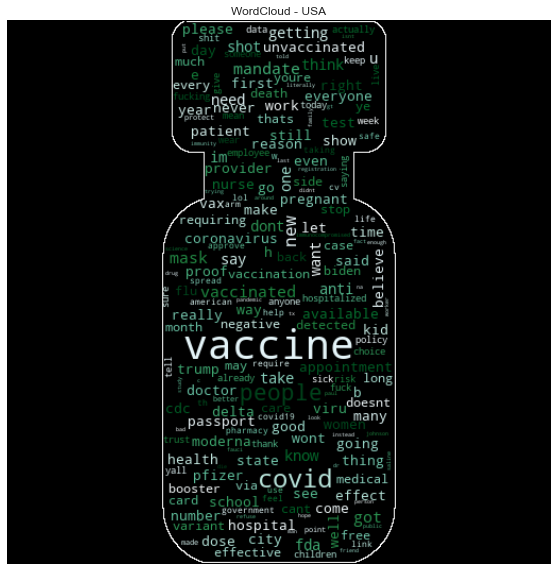

In [19]:
#Create a word cloud with most used words

%matplotlib inline

my_mask = np.array(Image.open('vaccine_vial.png'))

text_cloud_usa = ""

for i in filtered_usa: 
    
    text_cloud_usa = text_cloud_usa + i + " "  

word_cloud_usa = WordCloud(collocations = False, mask = my_mask, background_color = 'black', colormap = "BuGn",
                       contour_width = 1, contour_color = 'white', width = 600, height = 300,)

cloud_usa = word_cloud_usa.generate(text_cloud_usa)

plt.figure(figsize = (20, 10))
plt.imshow(word_cloud_usa, interpolation='bilinear')
plt.axis("off")
plt.title("WordCloud - USA")

cloud_usa.to_file("wordcloud_usa.png")

plt.show()

In [20]:
#Create a bar plot with most used words

fig = px.bar(freq_df_usa, x = "Word", y = "Frequency", title = "Word Frequency Bar Plot - USA")
fig.update_traces(marker_color = 'rgb(0,139,139)', marker_line_color = 'rgb(0,0,0)', marker_line_width = 2)

fig.show()

## Generate the USA map

In [21]:
#Create a list and append every user location that matches one of the states from the dictionary

USA_loc = []
geo = df[['user_location']]

for l in df['user_location']:
    
    flag = 0
    
    for s in states:
        
        if s in l:
            
            USA_loc.append(state_dict[s] if s in state_dict else s)
            
            flag = 1
    
            break
    
    if (flag == 1):
        
        USA_loc.append(None)

#Make a dataframe with the data

geo_dist = pd.DataFrame(USA_loc, columns=['State']).dropna().reset_index()
geo_dist = geo_dist.groupby('State').count().rename(columns={"index": "Number"}).sort_values(by=['Number'], ascending=False).reset_index()
geo_dist["Log Number"] = geo_dist["Number"].apply(lambda x: math.log(x, 2))
geo_dist['Full State Name'] = geo_dist['State'].apply(lambda x: inv_state_dict[x])
geo_dist['text'] = geo_dist['Full State Name'] + '<br>' + 'Num: ' + geo_dist['Number'].astype(str)

geo_dist

,State,Number,Log Number,Full State Name,text
0,CA,1959,10.935902,California,California<br>Num: 1959
1,TX,1544,10.592457,Texas,Texas<br>Num: 1544
2,NY,1200,10.228819,New York,New York<br>Num: 1200
3,FL,941,9.878051,Florida,Florida<br>Num: 941
4,OH,461,8.848623,Ohio,Ohio<br>Num: 461
5,PA,456,8.832890,Pennsylvania,Pennsylvania<br>Num: 456
6,WA,432,8.754888,Washington,Washington<br>Num: 432
7,GA,409,8.675957,Georgia,Georgia<br>Num: 409
8,NC,389,8.603626,North Carolina,North Carolina<br>Num: 389
9,IL,388,8.599913,Illinois,Illinois<br>Num: 388


In [22]:
#Create the map

fig = go.Figure(data = go.Choropleth(locations = geo_dist['State'], z = geo_dist['Log Number'].astype(float),
                                     locationmode = 'USA-states', colorscale = "darkmint",text = geo_dist['text'],
                                     marker_line_color = 'white', colorbar_title = "Numbers in Log2"))
fig.update_layout(geo_scope = 'usa', title = "USA Tweet Map")

fig.show()

## Adding everything together side by side

In [23]:
#Create the subplots

myspecs = [[{"type": "scatter", "rowspan": 2}, {"type": "scatter", "rowspan": 2}],
           [None, None],
           [{"type": "pie", "rowspan": 2},{"type": "pie", "rowspan": 2}],
           [None, None],
           [{"type": "image", "rowspan": 3},{"type": "image", "rowspan": 3}],
           [None, None],
           [None, None],
           [{"type": "bar", "rowspan": 2},{"type": "bar", "rowspan": 2}],
           [None, None],
           [{"type": "choropleth", "rowspan": 2, "colspan": 2}, None],
           [None,None]]

mysubplot_titles = ('Time series World', 'Time series USA', 'Pie World','Pie USA', 'WordCloud World','WordCloud USA', 
            'Words World','Words USA', 'USA map')

fig = make_subplots(cols = 2, rows = 11, specs = myspecs, subplot_titles = mysubplot_titles)

In [24]:
%%capture

#Time series World

fig.add_trace(go.Scatter(x = time_series, y = time_series_df[f"Number of Covid-19 vaccine mentions"][time_series_df['polarity'] == 0].reset_index(drop = True),
                         name = "Neutral", opacity = 0.8), row = 1, col = 1,)   

fig.add_trace(go.Scatter(x = time_series, y = time_series_df[f"Number of Covid-19 vaccine mentions"][time_series_df['polarity'] == -1].reset_index(drop = True),
                         name ="Negative", opacity = 0.8), row = 1, col = 1)

fig.add_trace(go.Scatter(x = time_series, y = time_series_df[f"Number of Covid-19 vaccine mentions"][time_series_df['polarity'] == 1].reset_index(drop = True),
                         name = "Positive", opacity = 0.8), row = 1, col = 1)

In [25]:
%%capture

#Time series USA

fig.add_trace(go.Scatter(x = time_series_usa, y = time_series_df_usa[f"Number of Covid-19 vaccine mentions"][time_series_df_usa['polarity'] == 0].reset_index(drop = True),
                         name = "Neutral", opacity = 0.8), row = 1, col = 2)   

fig.add_trace(go.Scatter(x = time_series_usa, y = time_series_df_usa[f"Number of Covid-19 vaccine mentions"][time_series_df_usa['polarity'] == -1].reset_index(drop = True),
                         name ="Negative", opacity = 0.8), row = 1, col = 2)

fig.add_trace(go.Scatter(x = time_series_usa, y = time_series_df_usa[f"Number of Covid-19 vaccine mentions"][time_series_df_usa['polarity'] == 1].reset_index(drop = True),
                         name = "Positive", opacity = 0.8), row = 1, col = 2)

In [26]:
%%capture

#Pie World

fig.add_trace(go.Pie(labels = mylabels, values = myvalues, hovertemplate = "%{label}: <br>Value: %{value}",
                     marker = dict(colors = mycolors, line = dict(color = '#000000', width = 4)), opacity = 0.7,
                     showlegend = True, textposition = 'inside', rotation = 90), row = 3, col = 1)    



In [27]:
%%capture

#Pie USA

fig.add_trace(go.Pie(labels = mylabels, values = myvalues_usa, hovertemplate = "%{label}: <br>Value: %{value}",
                     marker = dict(colors = mycolors, line = dict(color = '#000000', width = 4)), opacity = 0.7,
                     showlegend = True, textposition = 'inside', rotation = 90), row = 3, col = 2) 

In [28]:
%%capture

#WordCloud World

image = Image.open('wordcloud_world.png')

img_width = 600
img_height = 3000

fig.add_trace(go.Scatter(x = [0, img_width], y = [0, img_height], mode = "markers", marker_opacity = 0), row = 5, col = 1)

fig.add_layout_image(dict(x = 0, sizex = img_width, y = img_height, sizey = img_height, xref = "x", yref = "y", opacity = 1.0,
                          layer = "above", sizing = "stretch", source = image), 
                     row = 5, col = 1)

In [29]:
%%capture

#WordCloud USA

image_usa = Image.open('wordcloud_usa.png')

img_usa_width = 600
img_usa_height = 3000

fig.add_trace(go.Scatter(x = [0, img_usa_width], y = [0, img_usa_height], mode = "markers", marker_opacity = 0), row = 5, col = 2)

fig.add_layout_image(dict(x = 0, sizex = img_usa_width, y = img_usa_height, sizey = img_usa_height, xref = "x", yref = "y", 
                          opacity = 1.0, layer = "above", sizing = "stretch", source = image_usa), 
                     row = 5, col = 2)

In [30]:
%%capture

#Bar plot World

fig.add_trace(go.Bar(x = freq_df["Word"], y = freq_df["Frequency"], marker_color = 'rgb(0,139,139)', 
                     marker_line_color = 'rgb(8,48,107)', marker_line_width = 0.5, opacity = 0.7), row = 8, col = 1)

In [31]:
%%capture

#Bar plot USA

fig.add_trace(go.Bar(x = freq_df_usa["Word"], y = freq_df_usa["Frequency"], marker_color = 'rgb(0,139,139)', 
                     marker_line_color = 'rgb(8,48,107)', marker_line_width = 0.5, opacity = 0.7), row = 8, col = 2)

In [32]:
%%capture

#USA map

fig.add_trace(go.Choropleth(locations = geo_dist['State'], z = geo_dist['Log Number'].astype(float), 
                            locationmode = 'USA-states', colorscale = "darkmint", text = geo_dist['text'], 
                            showscale = False, geo = 'geo'), row = 10, col = 1)


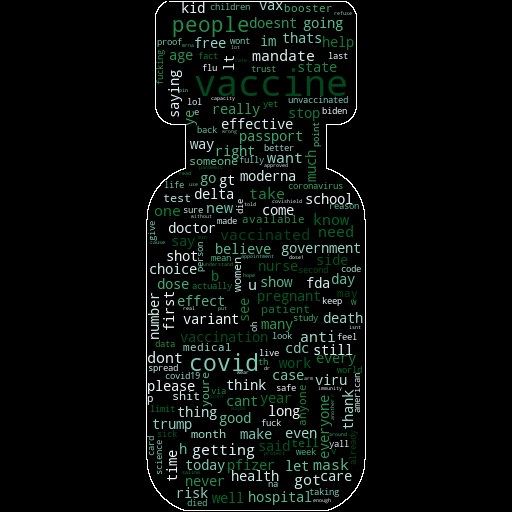
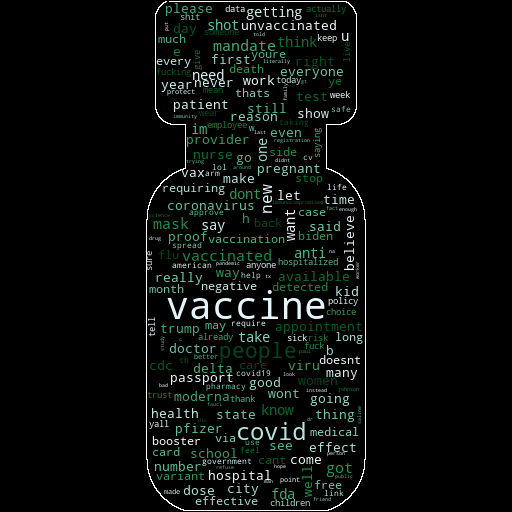

In [33]:
mytitle = f"Real-time tracking Covid-19 vaccine mentions collected from {len(df.index)} tweets from Twitter,<br>which {len(df_usa.index)} of those were created at USA {'('}{round(percent_usa, 2)}{'%)'}."

fig.update_layout(title_text = mytitle,  geo = dict(scope = 'usa'), template = "plotly_dark", 
                  margin = dict(r = 20, t = 50, b = 50, l = 20),
                  annotations = [go.layout.Annotation(text = "Source: Twitter", showarrow = False, 
                                                      xref = "paper", yref = "paper", x = 0, y = 0)], 
                  showlegend = False, xaxis_rangeslider_visible = False, height = 1600, width = 980)